## Load the breast cancer dataset using datasets.load_breast_cancer()

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.datasets import load_breast_cancer

info = load_breast_cancer()

In [3]:
infoX= info['data']

In [4]:
infoY = info['target']

In [5]:
infoNames = info['feature_names']

## Use scatter plots to look at the data (use different colors for the classes)

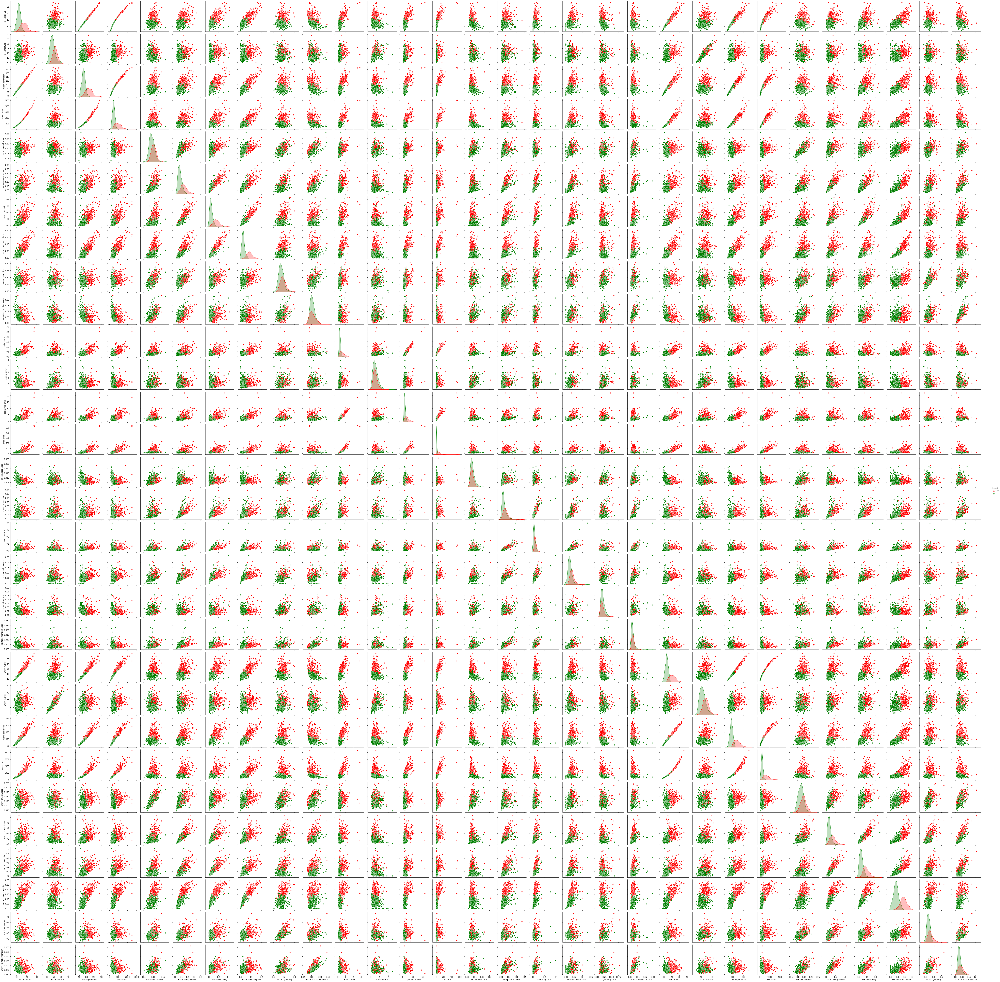

In [6]:
import seaborn as sns

# here Loading the breast cancer dataset
info = load_breast_cancer()
info_df = pd.DataFrame(data=infoX, columns=infoNames)
info_df['target'] = infoY

# Creating a pair plot of the dataset with different colors
sns.pairplot(info_df, hue='target', vars=info.feature_names, palette=['red', 'green'])
plt.show()


## Use box plots to look at the data

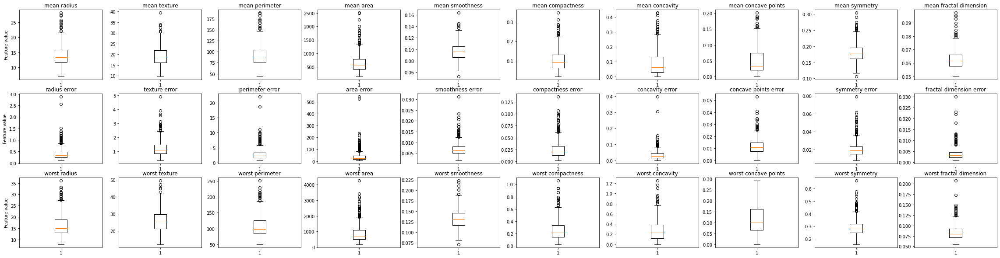

In [ ]:
X = infoX[:, :]

# Creating a figure with subplots
fig, axes = plt.subplots(nrows=3, ncols=10, figsize=(40, 10))
# here we are Plotting box plots for each feature
for i, ax in enumerate(axes.flat):
    ax.boxplot(X[:, i])
    ax.set_title(info.feature_names[i])
for ax in axes[:, 0]:
    ax.set_ylabel('Feature value')    
# Displaying the figure
plt.show()

## create a training and test set with random_state = 3

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(infoX, infoY,random_state=3)


## train a decision tree model on the training set.

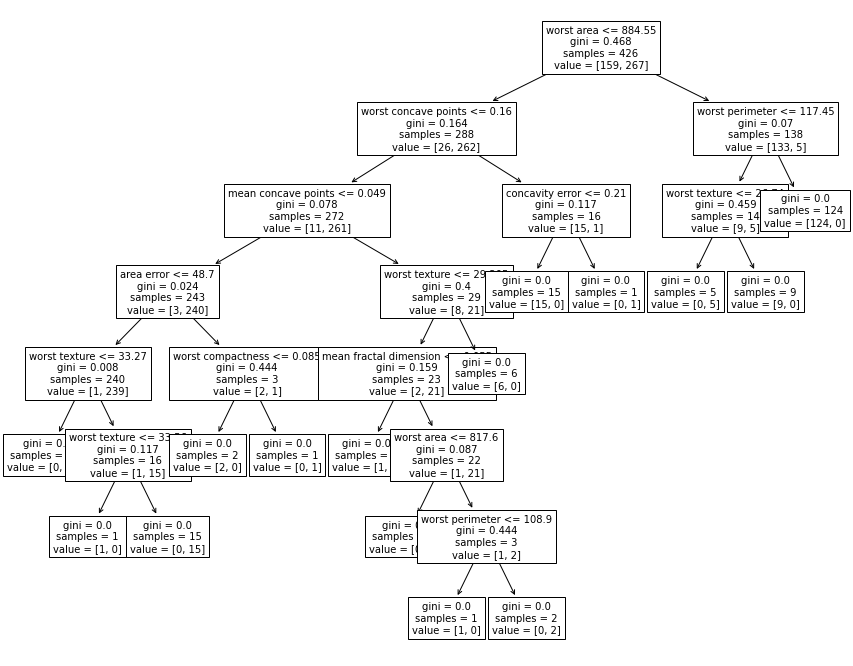

In [ ]:
from sklearn.tree import DecisionTreeClassifier

tree_model = DecisionTreeClassifier(criterion='gini')
tree_model.fit(X_train, y_train)

from sklearn import tree

plt.figure(figsize=(15,12))
tree.plot_tree(tree_model, feature_names=infoNames, fontsize=10)
plt.show()

In [ ]:
print(f'Training accuracy: {tree_model.score(X_train, y_train):.2f}')
print(f'Test accuracy: {tree_model.score(X_test, y_test):.2f}')

Training accuracy: 1.00
Test accuracy: 0.94


## train a logistic regression model on the training set

In [ ]:
from sklearn.linear_model import LogisticRegression
LR = LogisticRegression(solver='lbfgs', max_iter=3000)
LR.fit(X_train, y_train)

LogisticRegression(max_iter=3000)

In [ ]:
fit = LR.fit(X_train, y_train)

In [ ]:
gen = fit.predict(X_test)

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, gen))

              precision    recall  f1-score   support

           0       0.94      0.92      0.93        53
           1       0.96      0.97      0.96        90

    accuracy                           0.95       143
   macro avg       0.95      0.95      0.95       143
weighted avg       0.95      0.95      0.95       143



## Score for the training set

In [ ]:
score = LR.score(X_train, y_train)
print(f'Validation Best Score: {score:.2%}')

Validation Best Score: 96.01%


## train a random forest model on the training set

In [ ]:
from sklearn.ensemble import RandomForestClassifier
X_train, X_test, y_train, y_test = train_test_split(infoX, infoY,random_state=3)
rf_model = RandomForestClassifier(n_estimators=500)
rf_model.fit(X_train, y_train)


RandomForestClassifier(n_estimators=500)

In [ ]:
gen = fit.predict(X_test)
from sklearn.metrics import classification_report
print(classification_report(y_test, gen))

              precision    recall  f1-score   support

           0       0.94      0.92      0.93        53
           1       0.96      0.97      0.96        90

    accuracy                           0.95       143
   macro avg       0.95      0.95      0.95       143
weighted avg       0.95      0.95      0.95       143



In [ ]:
print(f'Training accuracy: {rf_model.score(X_train, y_train):.2%}')
print(f'Test accuracy: {rf_model.score(X_test, y_test):.2%}')

Training accuracy: 100.00%
Test accuracy: 94.41%


## Which model performed better?

In [ ]:
# decision tree
dt_score = tree_model.score(X_train, y_train)
print("Decision tree test set accuracy: {:.2f}".format(dt_score))
# Logistic Regression
lr_score = LR.score(X_train, y_train)
print("Logistic regression test set accuracy: {:.2f}".format(lr_score))
# random forest
rf_score = rf_model.score(X_train, y_train)
print("Random forest test set accuracy: {:.2f}".format(rf_score))

Decision tree test set accuracy: 1.00
Logistic regression test set accuracy: 0.96
Random forest test set accuracy: 1.00


## Which features were most relevant in each model (a part from random forest)?

### 1. Decision Tree

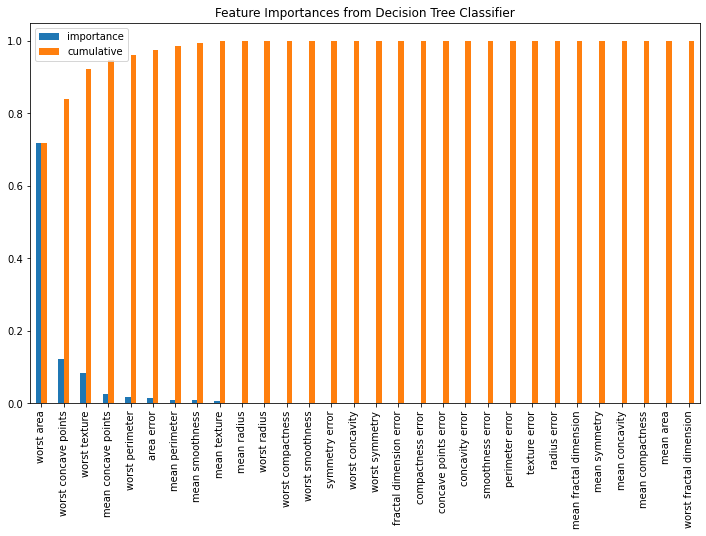

In [ ]:
tree_model = DecisionTreeClassifier(criterion='gini', random_state=1)
tree_model.fit(X_train, y_train)
impt = tree_model.feature_importances_

impt = list(zip(info['feature_names'], impt))
impt = pd.DataFrame(impt)
impt.columns = ['feature', 'importance']
impt = impt.set_index('feature')
impt = impt.sort_values(by='importance', ascending=False)
impt['cumulative'] = impt['importance'].cumsum()

impt.plot.bar(figsize=(12,7))
plt.title('Feature Importances from Decision Tree Classifier')
plt.xlabel('')
plt.show()

### 2. Logistic regression

In [ ]:
coefficients = LR.coef_

In [ ]:
coefficients

array([[ 1.03858935,  0.3429005 , -0.08755862,  0.00840067, -0.12686228,
        -0.23525805, -0.45252937, -0.18665589, -0.23063222, -0.03868534,
        -0.08064767,  0.91575532, -0.03273058, -0.10888426, -0.01502187,
         0.00303139, -0.0793344 , -0.02506539, -0.037245  ,  0.00299757,
         0.30754856, -0.5268669 , -0.13962817, -0.01388354, -0.25638118,
        -0.84067876, -1.34148977, -0.40887994, -0.69936878, -0.11830848]])

In [ ]:
for feature, coefficient in zip(info.feature_names, coefficients[0]):
    print("%s: %.2f" % (feature, coefficient))

mean radius: 1.04
mean texture: 0.34
mean perimeter: -0.09
mean area: 0.01
mean smoothness: -0.13
mean compactness: -0.24
mean concavity: -0.45
mean concave points: -0.19
mean symmetry: -0.23
mean fractal dimension: -0.04
radius error: -0.08
texture error: 0.92
perimeter error: -0.03
area error: -0.11
smoothness error: -0.02
compactness error: 0.00
concavity error: -0.08
concave points error: -0.03
symmetry error: -0.04
fractal dimension error: 0.00
worst radius: 0.31
worst texture: -0.53
worst perimeter: -0.14
worst area: -0.01
worst smoothness: -0.26
worst compactness: -0.84
worst concavity: -1.34
worst concave points: -0.41
worst symmetry: -0.70
worst fractal dimension: -0.12


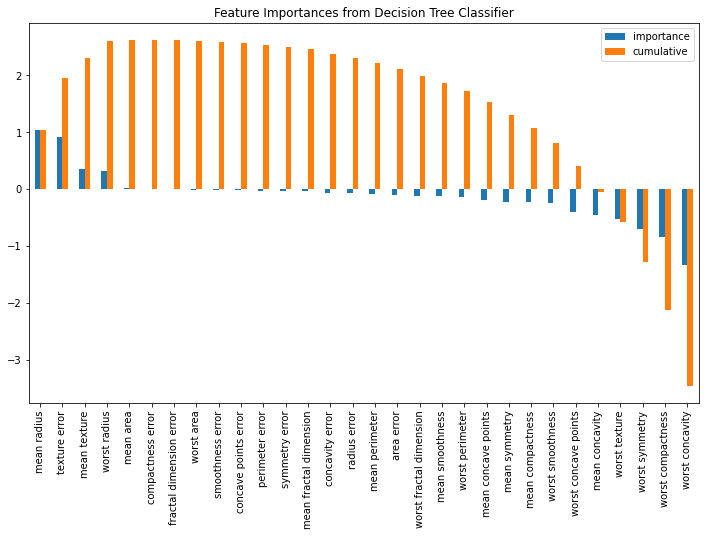

In [ ]:
impt = list(zip(info.feature_names, coefficients[0]))
impt = pd.DataFrame(impt)
impt.columns = ['feature', 'importance']
impt = impt.set_index('feature')
impt = impt.sort_values(by='importance', ascending=False)
impt['cumulative'] = impt['importance'].cumsum()

impt.plot.bar(figsize=(12,7))
plt.title('Feature Importances from Decision Tree Classifier')
plt.xlabel('')
plt.show()


## Use grid search to improve performance on the best performed model

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

params = {'n_estimators': [100, 200, 500, 750],
          'max_depth': [1, 2, 5, 10]
         }

rfm = GridSearchCV(RandomForestClassifier(), param_grid = params, cv=10,
                  scoring='accuracy')

rfm = rfm.fit(X_train, y_train)
rfm.best_estimator_

RandomForestClassifier(max_depth=10, n_estimators=200)

In [ ]:
print(f'Validation Best Score: {rfm.best_score_:.2%}')
print(f'Test Score: {rfm.score(X_test, y_test):.2%}')
print(f'Train Score: {rfm.score(X_train, y_train):.2%}')

Validation Best Score: 97.17%
Test Score: 93.71%
Train Score: 100.00%
